In [1]:
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil

In [149]:
def bar_charts_categorical(df, feature, target):
    cont_tab = pd.crosstab(df[feature], df[target], margins = True)
    categories = cont_tab.index[:-1]
        
    fig = plt.figure(figsize=(30, 5))
    
    plt.subplot(121)
    p1 = plt.bar(categories, cont_tab.iloc[:-1, 0].values, 0.55, color="gray")
    p2 = plt.bar(categories, cont_tab.iloc[:-1, 1].values, 0.55, bottom=cont_tab.iloc[:-1, 0], color="darkblue")
    plt.legend((p2[0], p1[0]), ('$y_i=1$', '$y_i=0$'))
    plt.title("Frequency bar chart")
    plt.xlabel(feature)
    plt.xticks(rotation="vertical")
    plt.ylabel("$Frequency$")

    # auxiliary data for 122
    obs_pct = np.array([np.divide(cont_tab.iloc[:-1, 0].values, cont_tab.iloc[:-1, 2].values), 
                        np.divide(cont_tab.iloc[:-1, 1].values, cont_tab.iloc[:-1, 2].values)])
      
    plt.subplot(122)
    p1 = plt.bar(categories, obs_pct[0], 0.55, color="gray")
    p2 = plt.bar(categories, obs_pct[1], 0.55, bottom=obs_pct[0], color="darkblue")
    plt.legend((p2[0], p1[0]), ('$y_i=1$', '$y_i=0$'),labelspacing =1)
    plt.title("Proportion bar chart")
    plt.xlabel(feature)
    plt.ylabel("$p$")
    plt.xticks(rotation="vertical")
    plt.show()
    

### Read File

In [16]:
data_original=pd.read_csv("donors.csv")

In [17]:
#Create a copy
data = data_original.copy()

In [18]:
#drop the index "Unnamed"
data.drop(["Unnamed: 0"], axis=1, inplace= True)
# replace " " by nans
data.replace(" ", np.nan, inplace=True)

In [36]:
data.columns                              

Index(['ODATEDW', 'OSOURCE', 'TCODE', 'STATE', 'ZIP', 'MAILCODE', 'DOB',
       'NOEXCH', 'RECINHSE', 'RECP3',
       ...
       'RFA_2F', 'RFA_2A', 'MDMAUD_R', 'MDMAUD_F', 'MDMAUD_A', 'GEOCODE2',
       'YEAR', 'MONTH', 'LDYears', 'LDMonths'],
      dtype='object', length=405)

In [42]:
data.dtypes.unique

<bound method Series.unique of ODATEDW     object
OSOURCE     object
TCODE        int64
STATE       object
ZIP         object
             ...  
GEOCODE2    object
YEAR        object
MONTH        int32
LDYears      int32
LDMonths     int32
Length: 405, dtype: object>

### Normalize Some Values and replacing empty String for Nans

In [24]:
Y_Values=["COLLECT1","VETERANS","BIBLE","CATLG","HOMEE","PETS","CDPLAY","STEREO","PCOWNERS","PHOTO","CRAFTS","FISHER","GARDENIN","BOATS","WALKER","KIDSTUFF","CARDS","PLATES"]
for i in Y_Values:
    data[i]=pd.Series(np.where(data[i].values == 'Y', 1, 0),data.index)
data[Y_Values]

,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95407,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
95408,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
95409,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
95410,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [25]:
X_values=["NOEXCH","RECINHSE","RECP3","RECPGVG","RECSWEEP","MAJOR","PEPSTRFL"]
for i in X_values:
    data[i]=pd.Series(np.where(data[i].values == 'X', 1, 0),data.index)
data[X_values]

,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MAJOR,PEPSTRFL
0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0
2,0,0,0,0,0,0,1
3,0,0,0,0,0,0,1
4,0,1,1,0,0,0,0
...,...,...,...,...,...,...,...
95407,0,0,0,0,0,0,0
95408,0,0,0,0,0,0,0
95409,0,0,1,0,0,0,1
95410,0,1,0,0,0,0,1


In [26]:
data["MAILCODE"]=pd.Series(np.where(data["MAILCODE"].values == 'B', 1, 0),data.index)

In [27]:
# replace " " by nans
data.replace(" ", np.nan, inplace=True)

### Dropping Columns with High percentege of missing values

In [28]:
#if a columns has more than half of missing values the column is removed
for i in data:
    if  data[i].isna().sum()/data.shape[0] >0.51:
        data.drop(i,axis=1,inplace=True)
print(data_original.shape[1]-data.shape[1],"columns were removed")

74 columns were removed


In [32]:
df= data['LASTDATE'].str.split("-",expand=True)
data['YEAR'] = df[0]
data['MONTH'] = df[1]
data["YEAR"]=data["YEAR"].astype(int)
data['MONTH'] = data['MONTH'].astype(int)
data["LDYears"] = 2017- data["YEAR"]

In [34]:
data['LDMonths'] = data["MONTH"] - 1
cv = data[["LDYears",'LDMonths']]
cv1 = cv[cv.LDYears < 2 ]
cv1 = cv1[cv1.LDYears > 0 ]
lapsedDonors = cv1[cv1.LDMonths < 12]

In [76]:
data['Lapsed Donor'] = np.where(data.index.isin(lapsedDonors.index), 'LD', 'NLD')

In [50]:
df= data['DOB'].str.split("-",expand=True)
data['YEARob'] = df[0]

In [54]:
data[data['YEARob'].isnull()]
data['YEARob'] = pd.to_numeric(data['YEARob'], errors='coerce')
data = data.dropna(subset=['YEARob'])
data['YEARob'] = data['YEARob'].astype(int)

<ipython-input-54-8b9f3c436bff>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['YEARob'] = pd.to_numeric(data['YEARob'], errors='coerce')


In [55]:
data["AGE"] = 2017- data["YEARob"]

In [152]:
data["GENDER"].replace({' ':'U', 'C':'U','A':'U'}, inplace=True)

### Visualization

In [172]:
non_metric_features = ["STATE", "GENDER", "GEOCODE2", "DOMAIN", "RFA_2A", "DATASRCE","WEALTH2", "WEALTH1", "INCOME","Lapsed Donor"]
#, "MDMAUD_F","MDMAUD_A"

#### Categorical Variables

In [256]:
#Meti a variavel "Lapsed Donor" como label. Podemos meter outra mas esta fez-me sentido

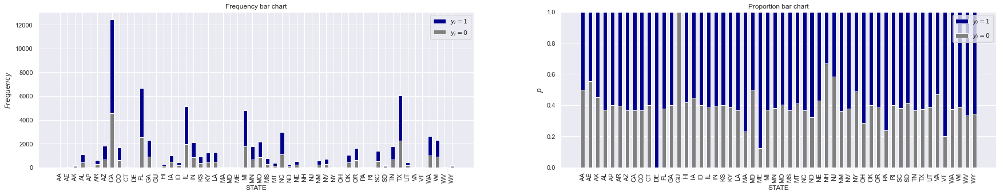

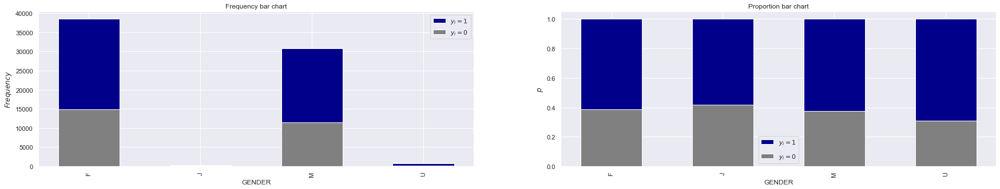

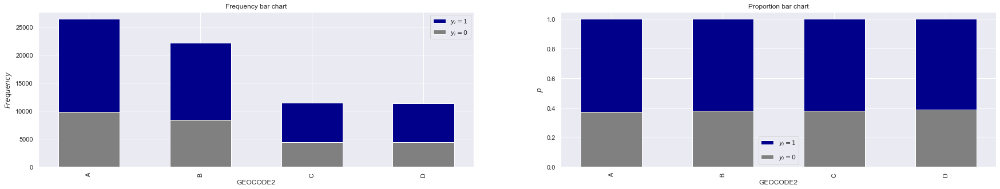

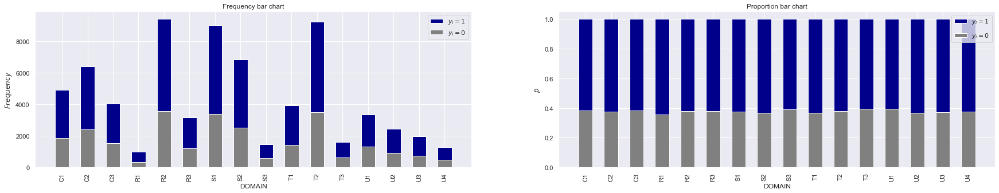

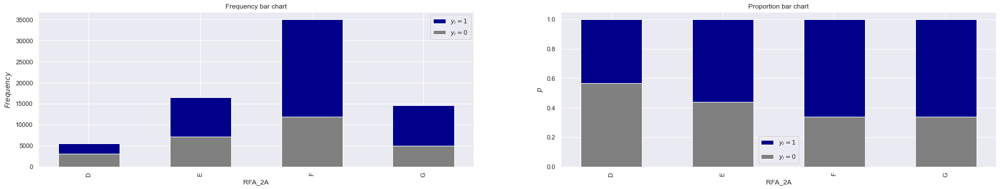

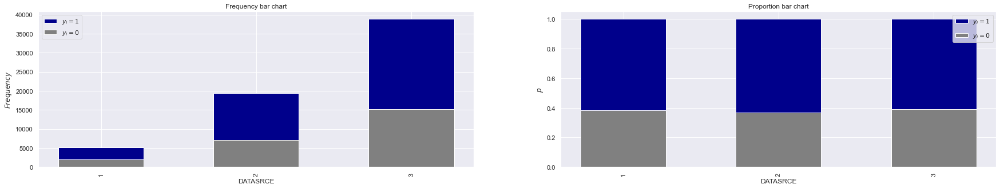

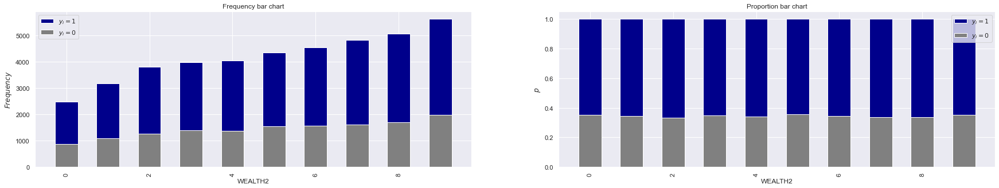

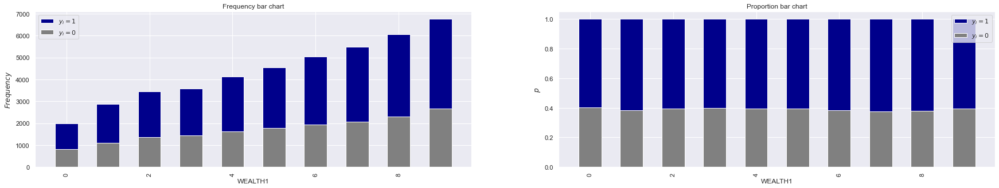

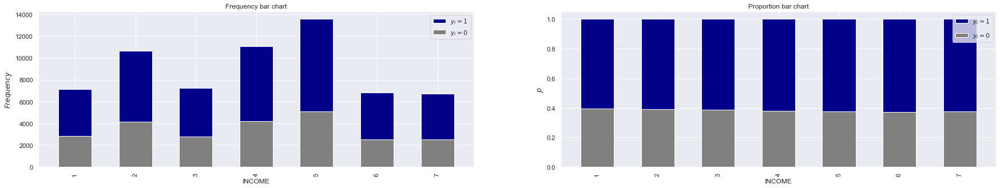

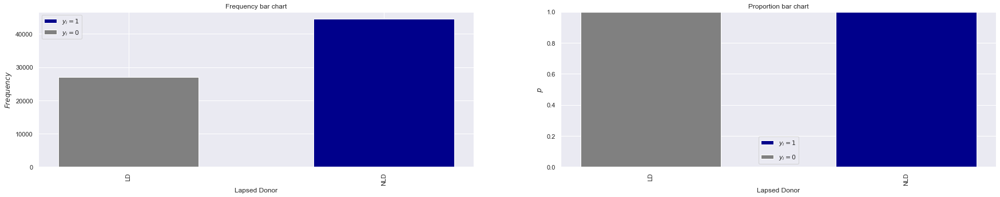

In [189]:
for i in non_metric_features :   
    bar_charts_categorical(data, i, "Lapsed Donor")

### Pairwise Relationship of Numerical Variables

#### Numeric Variables 

In [210]:
metric_features = data[[ "AGE", "HIT", "CARDPROM","CARDPM12","NUMPROM","NUMPRM12","LASTGIFT",
                         "RAMNTALL", "NGIFTALL", "MINRAMNT" ,"CARDGIFT","AVGGIFT", "TIMELAG", "MAXRAMNT"]].copy()

In [211]:
value_metric_features = metric_features.select_dtypes(include=["int32","float64","int64"]).columns.to_list()

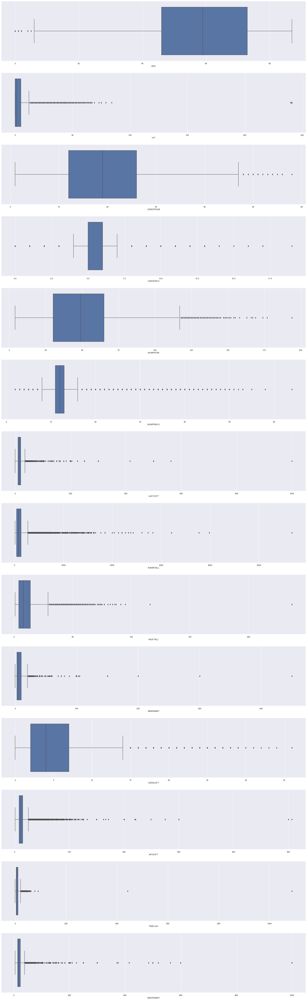

In [244]:
sns.set()
fig, axes = plt.subplots(len(value_metric_features), ceil(len(value_metric_features) / len(value_metric_features)), figsize=(30, 100))
for ax, feat in zip(axes.flatten(), value_metric_features):
    sns.boxplot(x=data[feat], ax=ax) 
plt.show()

In [280]:
#sns.set()
#sns.pairplot(data[value_metric_features], diag_kind="hist")
#plt.subplots_adjust(top=0.95)
#plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=30)
#plt.show()

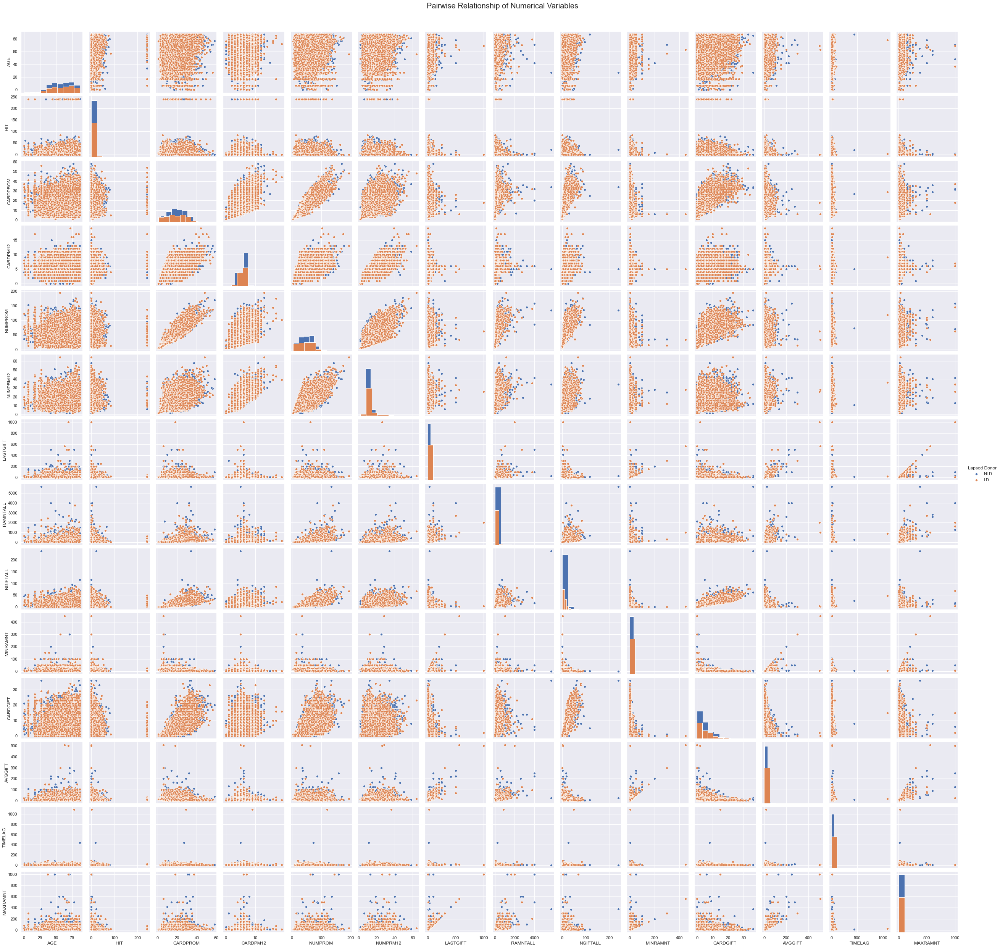

In [235]:
sns.set()
sns.pairplot(data[value_metric_features  + ['Lapsed Donor']], diag_kind="hist", hue='Lapsed Donor')
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)
plt.show()
#ORANGE - Lapsed Donor
#Blue - Not a Lapsed Donor

In [ ]:
#NUMERICAL 2

In [275]:
numerical2 =data[["POBC1","POBC2","POP902","POP90C2","POP90C3",
             "POP90C4","POP90C5","AGE901","SEC1","SEC2","SEC3","SEC5","LSC1","LSC3","LSC4","MARR1","MARR2","MARR4",
             "IC4","HHAS1","HHAS2","HHAS3","HHAS4","HV2","HV4"]].copy()

In [276]:
numerical_features = numerical2.select_dtypes(include=["int16","int32","float64","int64"]).columns.to_list()

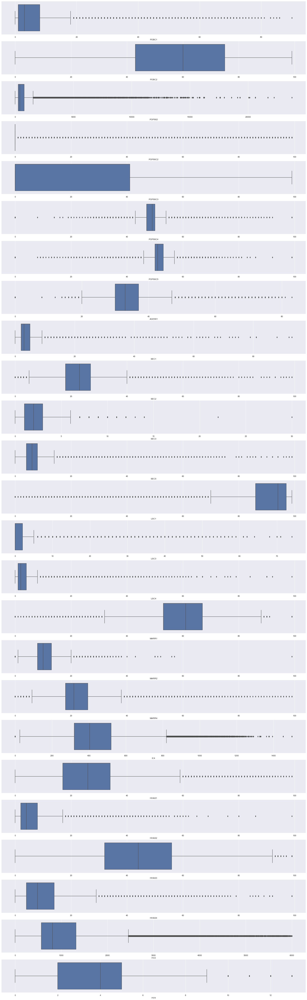

In [277]:
sns.set()
fig, axes = plt.subplots(len(numerical_features), ceil(len(numerical_features) / len(numerical_features)), figsize=(30, 100))
for ax, feat in zip(axes.flatten(),numerical_features):
    sns.boxplot(x=data[feat], ax=ax) 
plt.show()

In [281]:
#sns.set()
#sns.pairplot(data[numerical_features], diag_kind="hist")
#plt.subplots_adjust(top=0.95)
#plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=30)
#plt.show()

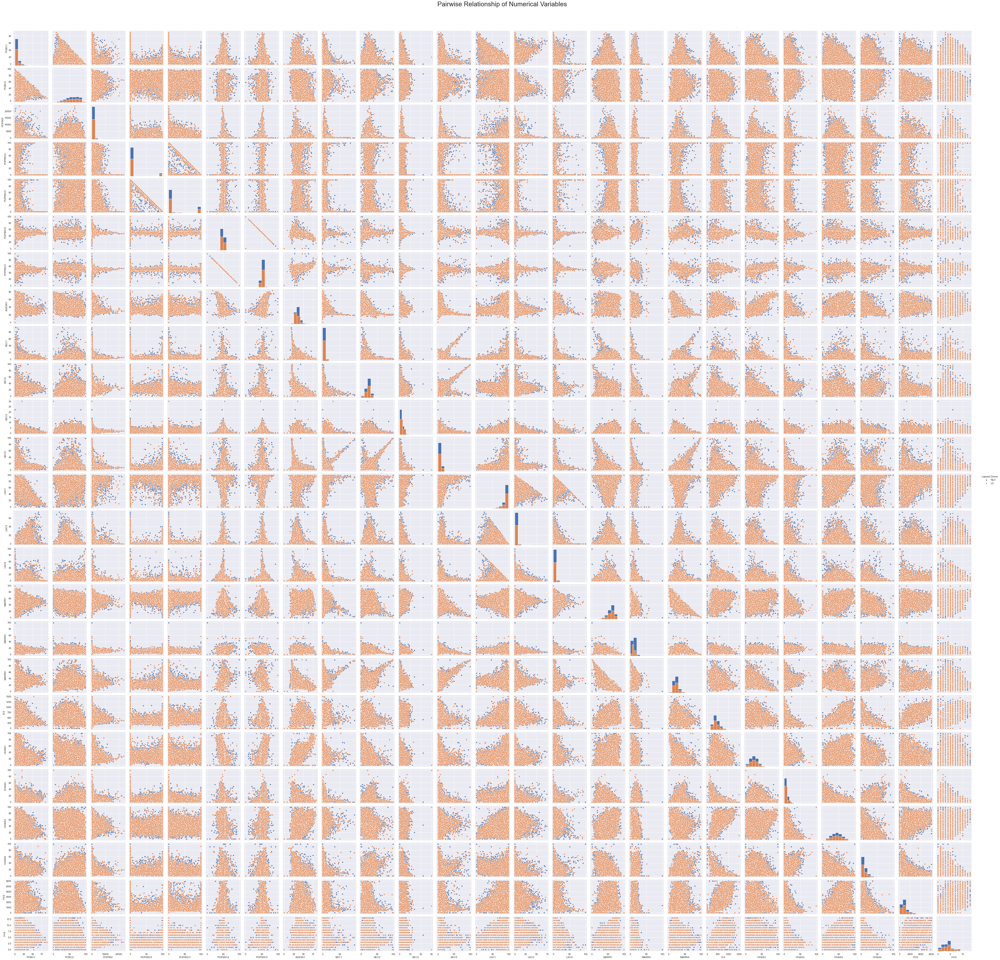

In [279]:
sns.set()
sns.pairplot(data[numerical_features + ["Lapsed Donor"]] , diag_kind="hist", hue = 'Lapsed Donor')
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=30)
plt.show()